In [2]:
import pandas as pd

In [3]:
energy_data = pd.read_csv(r"C:\Users\swaro\Downloads\hourly_energy\energy_dataset.csv") 
display(energy_data)

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17.0,NaN,6436.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16.0,NaN,5856.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8.0,NaN,5454.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2.0,NaN,5151.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9.0,NaN,4861.0,21785.0,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2018-12-31 19:00:00+01:00,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,...,277.0,0.0,3113.0,96.0,NaN,3253.0,30619.0,30653.0,68.85,77.02
35060,2018-12-31 20:00:00+01:00,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,...,280.0,0.0,3288.0,51.0,NaN,3353.0,29932.0,29735.0,68.40,76.16
35061,2018-12-31 21:00:00+01:00,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,...,286.0,0.0,3503.0,36.0,NaN,3404.0,27903.0,28071.0,66.88,74.30
35062,2018-12-31 22:00:00+01:00,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,...,287.0,0.0,3586.0,29.0,NaN,3273.0,25450.0,25801.0,63.93,69.89


In [4]:
copy_energy = energy_data.copy()


Apparantly most stats for some features are constituted to be 0 or Nan. we will remove those columns. We will also remove day ahead forecasting columns.

In [5]:
# columns to be removed due to all 0 or Nan values
col_names = ['generation fossil coal-derived gas', 'generation fossil oil shale','generation fossil peat',
           'generation geothermal', 'generation hydro pumped storage aggregated', 'generation marine',
           'generation wind offshore', 'forecast wind offshore eday ahead', 'forecast solar day ahead',
            'forecast wind onshore day ahead']

In [6]:
copy_energy = copy_energy.drop(col_names, axis = 1)

In [7]:
copy_energy.head(5)

,time,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,26118.0,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,24934.0,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,23515.0,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,22642.0,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,21785.0,20264.0,38.41,56.04


In [8]:
copy_energy.isnull().sum()

time                                            0
generation biomass                             19
generation fossil brown coal/lignite           18
generation fossil gas                          18
generation fossil hard coal                    18
generation fossil oil                          19
generation hydro pumped storage consumption    19
generation hydro run-of-river and poundage     19
generation hydro water reservoir               18
generation nuclear                             17
generation other                               18
generation other renewable                     18
generation solar                               18
generation waste                               19
generation wind onshore                        18
total load forecast                             0
total load actual                              36
price day ahead                                 0
price actual                                    0
dtype: int64

In [9]:
copy_energy.describe().T

,count,mean,std,min,25%,50%,75%,max
generation biomass,35045.0,383.513540,85.353943,0.00,333.0000,367.00,433.00,592.00
generation fossil brown coal/lignite,35046.0,448.059208,354.568590,0.00,0.0000,509.00,757.00,999.00
generation fossil gas,35046.0,5622.737488,2201.830478,0.00,4126.0000,4969.00,6429.00,20034.00
generation fossil hard coal,35046.0,4256.065742,1961.601013,0.00,2527.0000,4474.00,5838.75,8359.00
generation fossil oil,35045.0,298.319789,52.520673,0.00,263.0000,300.00,330.00,449.00
generation hydro pumped storage consumption,35045.0,475.577343,792.406614,0.00,0.0000,68.00,616.00,4523.00
generation hydro run-of-river and poundage,35045.0,972.116108,400.777536,0.00,637.0000,906.00,1250.00,2000.00
generation hydro water reservoir,35046.0,2605.114735,1835.199745,0.00,1077.2500,2164.00,3757.00,9728.00
generation nuclear,35047.0,6263.907039,839.667958,0.00,5760.0000,6566.00,7025.00,7117.00
generation other,35046.0,60.228585,20.238381,0.00,53.0000,57.00,80.00,106.00


In [10]:
copy_energy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 19 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil gas                        35046 non-null  float64
 4   generation fossil hard coal                  35046 non-null  float64
 5   generation fossil oil                        35045 non-null  float64
 6   generation hydro pumped storage consumption  35045 non-null  float64
 7   generation hydro run-of-river and poundage   35045 non-null  float64
 8   generation hydro water reservoir             35046 non-null  float64
 9   generation nuclear                           35047 non-null  float64
 10

In [11]:
copy_energy['time'] = pd.to_datetime(copy_energy['time'],utc=True)
copy_energy = copy_energy.set_index('time')
copy_energy

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,26118.0,25385.0,50.10,65.41
2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,24934.0,24382.0,48.10,64.92
2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,23515.0,22734.0,47.33,64.48
2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,22642.0,21286.0,42.27,59.32
2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,21785.0,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,30619.0,30653.0,68.85,77.02
2018-12-31 19:00:00+00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,29932.0,29735.0,68.40,76.16
2018-12-31 20:00:00+00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,27903.0,28071.0,66.88,74.30


In [12]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'total load actual')

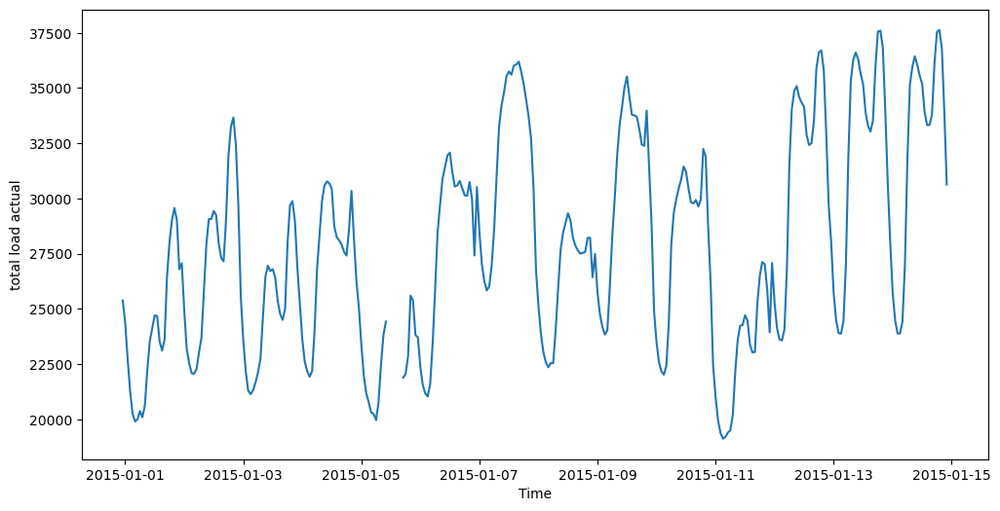

In [13]:
plt.figure(figsize=(12,6))
# plot total load actual for two weeks duration 
plt.plot(copy_energy['total load actual'][:24*7*2])
plt.xlabel('Time')
plt.ylabel('total load actual')

In [14]:
copy_energy[copy_energy.isna().any(axis = 1)]

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,
2015-01-05 02:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21912.0,21182.0,35.20,59.68
2015-01-05 11:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23209.0,NaN,35.50,79.14
2015-01-05 12:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23725.0,NaN,36.80,73.95
2015-01-05 13:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23614.0,NaN,32.50,71.93
2015-01-05 14:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22381.0,NaN,30.00,71.50
2015-01-05 15:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21371.0,NaN,30.00,71.85
2015-01-05 16:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20760.0,NaN,30.60,80.53
2015-01-19 18:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38642.0,39304.0,70.01,88.95
2015-01-19 19:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38758.0,39262.0,69.00,87.94


If the DataFrame has few missing values and the time series maintains a regular frequency, interpolation methods like linear or spline interpolation can effectively estimate the missing entries. However, if there are numerous missing values or if they occur irregularly, it may be more prudent to remove these gaps, as interpolating over extensive missing sections can add noise and bias to the data. Therefore, we will opt for linear interpolation to fill in the NaN values.

In [15]:
copy_energy.interpolate(method='linear', limit_direction='forward', inplace = True)

In [16]:
copy_energy.isnull().sum()

generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind onshore                        0
total load forecast                            0
total load actual                              0
price day ahead                                0
price actual                                   0
dtype: int64

In [17]:
import seaborn as sns

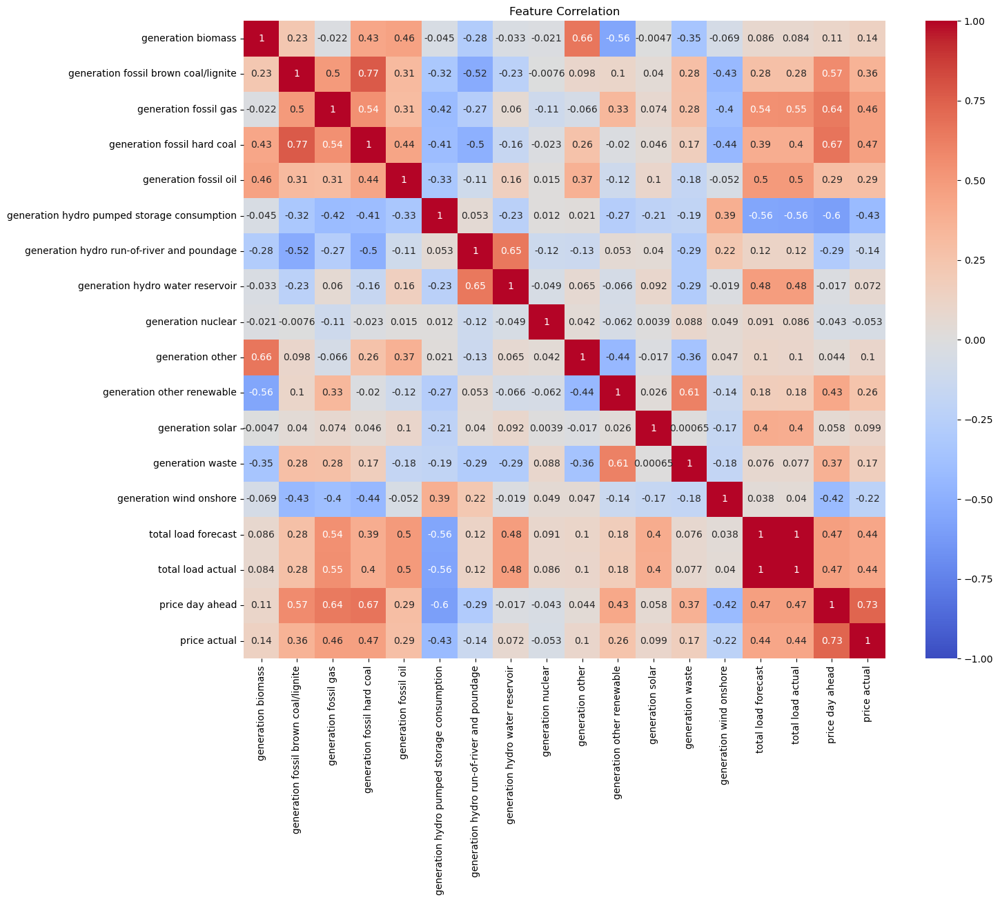

In [18]:
corr = copy_energy.corr()
plt.figure(figsize=(15,12))
#plot heat map
sns.heatmap(corr,annot=True,cmap="coolwarm", vmin=-1, vmax=1)
plt.title('Feature Correlation')
plt.show()

## Weather Data

In [19]:
df_weather = pd.read_csv(r"C:\Users\swaro\Downloads\hourly_energy\weather_features.csv")
display(df_weather)

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2015-01-01 00:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
1,2015-01-01 01:00:00+01:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,800,clear,sky is clear,01n
2,2015-01-01 02:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
3,2015-01-01 03:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
4,2015-01-01 04:00:00+01:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,800,clear,sky is clear,01n
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178391,2018-12-31 19:00:00+01:00,Seville,287.760,287.150,288.150,1028,54,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178392,2018-12-31 20:00:00+01:00,Seville,285.760,285.150,286.150,1029,62,3,30,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178393,2018-12-31 21:00:00+01:00,Seville,285.150,285.150,285.150,1028,58,4,50,0.0,0.0,0.0,0,800,clear,sky is clear,01n
178394,2018-12-31 22:00:00+01:00,Seville,284.150,284.150,284.150,1029,57,4,60,0.0,0.0,0.0,0,800,clear,sky is clear,01n


Based on a quick look at the dataframe we will notice that 'weather_icon' seems useless feature. Beside that colud cover that is reflected in 'weather_main' and 'weather_description' can afftect the prediction, but since this is hourly requirements and since their effect is reflected in measured temprerature, we can drop these two columns as well and instead we can keep 'clouds_all'. But before deciding on which feature to drop, lets see the feature correlations.

In [20]:
from sklearn.preprocessing import LabelEncoder

In [21]:
df_temp = df_weather.copy(deep = True)
labels = ['weather_id', 'weather_main','weather_description','weather_icon']
for col in labels:
    df_temp[col] = LabelEncoder().fit_transform(df_weather[col])

In [24]:
df_temp['dt_iso'] = pd.to_datetime(df_temp['dt_iso'],utc=True)

df_temp

,dt_iso,city_name,temp,temp_min,temp_max,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all,weather_id,weather_main,weather_description,weather_icon
0,2014-12-31 23:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,33,0,33,2
1,2015-01-01 00:00:00+00:00,Valencia,270.475,270.475,270.475,1001,77,1,62,0.0,0.0,0.0,0,33,0,33,2
2,2015-01-01 01:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,33,0,33,2
3,2015-01-01 02:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,33,0,33,2
4,2015-01-01 03:00:00+00:00,Valencia,269.686,269.686,269.686,1002,78,0,23,0.0,0.0,0.0,0,33,0,33,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178391,2018-12-31 18:00:00+00:00,Seville,287.760,287.150,288.150,1028,54,3,30,0.0,0.0,0.0,0,33,0,33,2
178392,2018-12-31 19:00:00+00:00,Seville,285.760,285.150,286.150,1029,62,3,30,0.0,0.0,0.0,0,33,0,33,2
178393,2018-12-31 20:00:00+00:00,Seville,285.150,285.150,285.150,1028,58,4,50,0.0,0.0,0.0,0,33,0,33,2
178394,2018-12-31 21:00:00+00:00,Seville,284.150,284.150,284.150,1029,57,4,60,0.0,0.0,0.0,0,33,0,33,2


In [30]:
df_temp = df_temp.drop(columns=['city_name'])

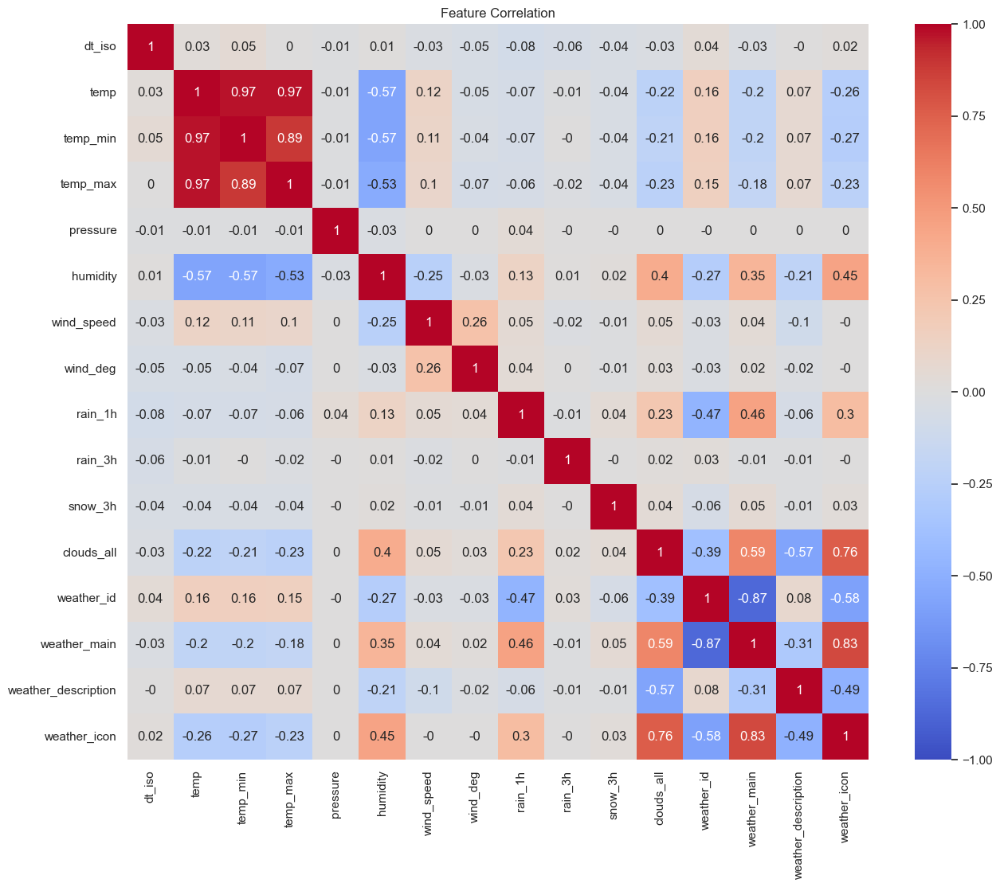

In [89]:
corr_weather = df_temp.corr().round(2)
plt.figure(figsize=(15,12))
#plot heat map
sns.heatmap(corr_weather,annot=True,cmap="coolwarm", vmin=-1, vmax=1)
plt.title('Feature Correlation')
plt.show()

Apparantly there is strong correlation between the features that we talked about. Having strong correlation between features might cuase multicolinearity. So, we can drop 'weather_icon', 'weather_main', 'weather_description', and 'weather_id' and just keep 'clouds_all'. There is also a very strong correlation between 'temp', 'temp_min' and 'temp_max'. So we drop temp_max and temp_min and just keep 'temp'.

In [33]:
df_weather['weather_id'].unique()

array([800, 801, 802, 803, 804, 500, 501, 502, 701, 522, 521, 503, 202,
       200, 201, 211, 520, 300, 741, 301, 711, 302, 721, 310, 600, 616,
       615, 601, 210, 602, 611, 311, 612, 620, 531, 731, 761, 771],
      dtype=int64)

In [34]:
import numpy as np

In [35]:
col_drop_name = ['weather_id', 'weather_main','weather_description','weather_icon', 'temp_min', 'temp_max']
# col_drop_name = ['weather_id', 'weather_main','weather_description','weather_icon']
df_weather.drop(col_drop_name, axis = 1 , inplace = True)

In [36]:
df_weather.isnull().sum()

dt_iso        0
city_name     0
temp          0
pressure      0
humidity      0
wind_speed    0
wind_deg      0
rain_1h       0
rain_3h       0
snow_3h       0
clouds_all    0
dtype: int64

In [37]:
df_weather.duplicated().sum()

3076

In [38]:
df_weather = df_weather.reset_index().drop_duplicates()

In [39]:
df_weather['time'] = pd.to_datetime(df_weather['dt_iso'],utc=True)
df_weather.drop(["dt_iso"] , axis = 1, inplace = True)
df_weather = df_weather.set_index('time')
df_weather.drop(["index"] , axis = 1, inplace = True)

In [40]:
df_weather

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
time,,,,,,,,,,
2014-12-31 23:00:00+00:00,Valencia,270.475,1001,77,1,62,0.0,0.0,0.0,0
2015-01-01 00:00:00+00:00,Valencia,270.475,1001,77,1,62,0.0,0.0,0.0,0
2015-01-01 01:00:00+00:00,Valencia,269.686,1002,78,0,23,0.0,0.0,0.0,0
2015-01-01 02:00:00+00:00,Valencia,269.686,1002,78,0,23,0.0,0.0,0.0,0
2015-01-01 03:00:00+00:00,Valencia,269.686,1002,78,0,23,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,Seville,287.760,1028,54,3,30,0.0,0.0,0.0,0
2018-12-31 19:00:00+00:00,Seville,285.760,1029,62,3,30,0.0,0.0,0.0,0
2018-12-31 20:00:00+00:00,Seville,285.150,1028,58,4,50,0.0,0.0,0.0,0


In [41]:
copy_energy

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,total load forecast,total load actual,price day ahead,price actual
time,,,,,,,,,,,,,,,,,,
2014-12-31 23:00:00+00:00,447.0,329.0,4844.0,4821.0,162.0,863.0,1051.0,1899.0,7096.0,43.0,73.0,49.0,196.0,6378.0,26118.0,25385.0,50.10,65.41
2015-01-01 00:00:00+00:00,449.0,328.0,5196.0,4755.0,158.0,920.0,1009.0,1658.0,7096.0,43.0,71.0,50.0,195.0,5890.0,24934.0,24382.0,48.10,64.92
2015-01-01 01:00:00+00:00,448.0,323.0,4857.0,4581.0,157.0,1164.0,973.0,1371.0,7099.0,43.0,73.0,50.0,196.0,5461.0,23515.0,22734.0,47.33,64.48
2015-01-01 02:00:00+00:00,438.0,254.0,4314.0,4131.0,160.0,1503.0,949.0,779.0,7098.0,43.0,75.0,50.0,191.0,5238.0,22642.0,21286.0,42.27,59.32
2015-01-01 03:00:00+00:00,428.0,187.0,4130.0,3840.0,156.0,1826.0,953.0,720.0,7097.0,43.0,74.0,42.0,189.0,4935.0,21785.0,20264.0,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,297.0,0.0,7634.0,2628.0,178.0,1.0,1135.0,4836.0,6073.0,63.0,95.0,85.0,277.0,3113.0,30619.0,30653.0,68.85,77.02
2018-12-31 19:00:00+00:00,296.0,0.0,7241.0,2566.0,174.0,1.0,1172.0,3931.0,6074.0,62.0,95.0,33.0,280.0,3288.0,29932.0,29735.0,68.40,76.16
2018-12-31 20:00:00+00:00,292.0,0.0,7025.0,2422.0,168.0,50.0,1148.0,2831.0,6076.0,61.0,94.0,31.0,286.0,3503.0,27903.0,28071.0,66.88,74.30


Based on stats below, we can see that there are some outliers in pressure, wind_speed and maybe rain_1h and rain_3h. So we can see outliers in the plots. we will remove pressure and wind_speed outlier and also drop rain_3h. Becuase rain_3h is supposed to be the amount of percipitation in the last 3 hr which should be higher than rain_1h, but the plot does not confirm this. So we drop rain_3h.

In [42]:
df_weather.describe().round(2)

,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,rain_3h,snow_3h,clouds_all
count,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00,178396.00
mean,289.62,1069.26,68.42,2.47,166.59,0.08,0.00,0.00,25.07
std,8.03,5969.63,21.90,2.10,116.61,0.40,0.01,0.22,30.77
min,262.24,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,283.67,1013.00,53.00,1.00,55.00,0.00,0.00,0.00,0.00
50%,289.15,1018.00,72.00,2.00,177.00,0.00,0.00,0.00,20.00
75%,295.15,1022.00,87.00,4.00,270.00,0.00,0.00,0.00,40.00
max,315.60,1008371.00,100.00,133.00,360.00,12.00,2.32,21.50,100.00


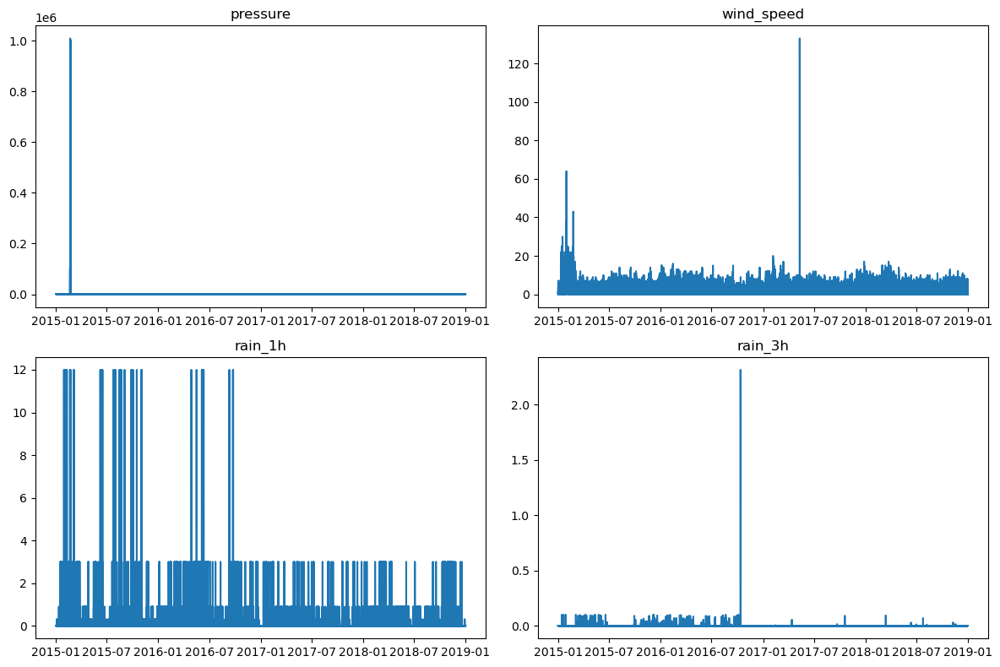

In [43]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.plot(df_weather.index, df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

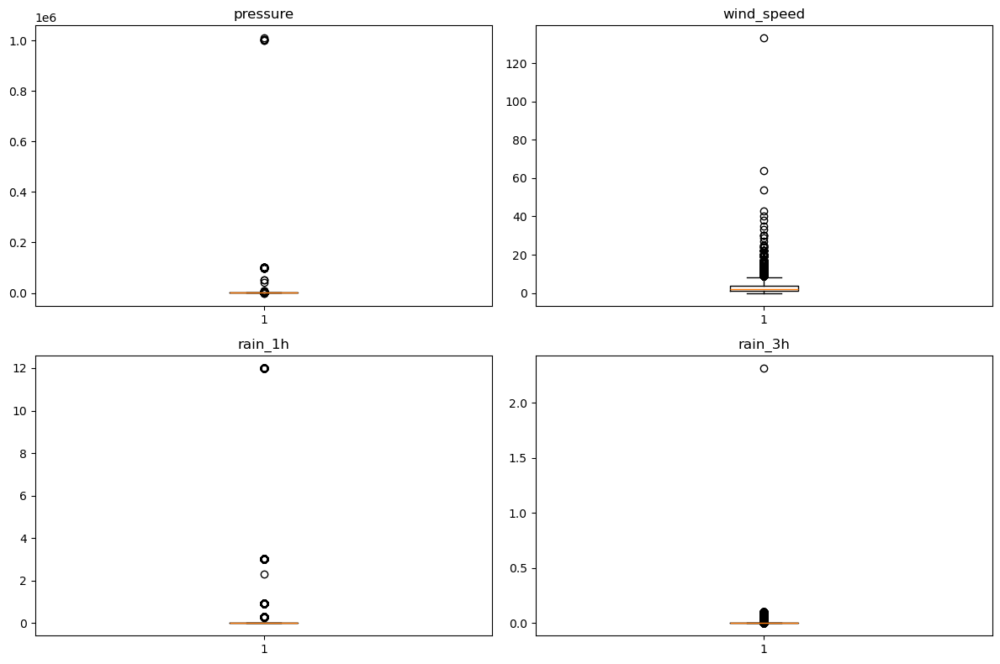

In [44]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.boxplot(x = df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

Note:


- Maximum pressure on earth is recorded as 1080hPa : https://wmo.asu.edu/content/world-highest-sea-level-air-pressure-below-700m
- Minimum pressure on earth is recorded as 870hPa : https://wmo.asu.edu/content/world-lowest-sea-level-air-pressure-excluding-tornadoes
- Maximum wind speed on earth is recorded as 113 m/s : https://www.wunderground.com/cat6/the-highest-anemometer-measured-wind-speeds-on-earth

- So we set the max threshold as these numbers and replace the outliers with Nan values and then use interpolation to fill the gap.

In [45]:
df_weather.loc[df_weather['pressure']  > 1080,  'pressure'] = np.nan
df_weather.loc[df_weather['pressure']   < 870,  'pressure'] = np.nan
df_weather.loc[df_weather['wind_speed'] > 113, 'wind_speed'] = np.nan

df_weather.interpolate(method ='linear', limit_direction ='forward', inplace = True)

C:\Users\swaro\AppData\Local\Temp\ipykernel_13092\42852904.py:5: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_weather.interpolate(method ='linear', limit_direction ='forward', inplace = True)


Check if the outliers are removed!

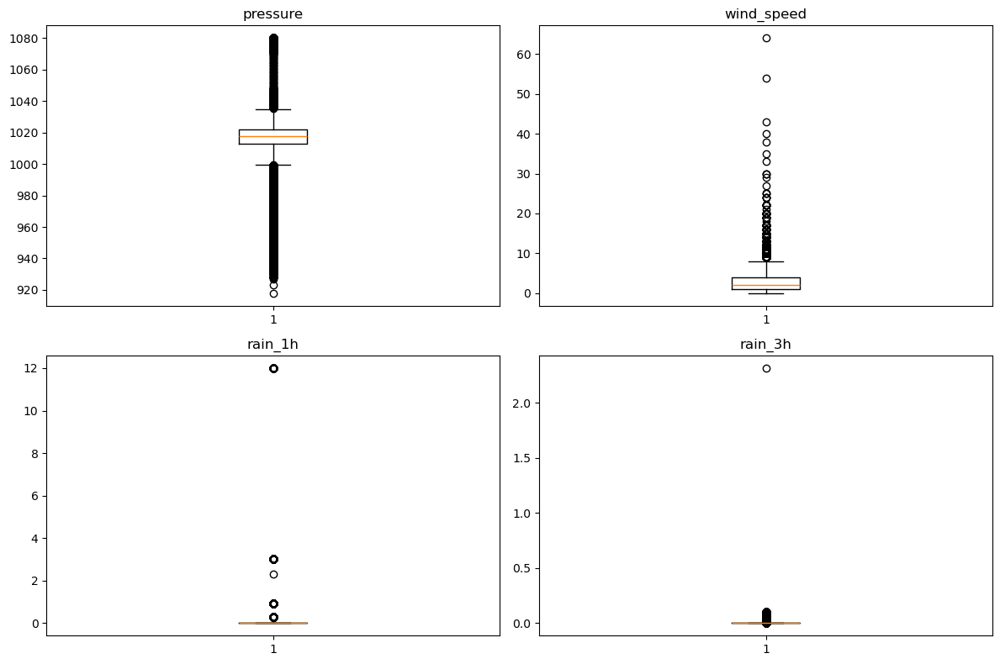

In [46]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8))

# select the columns to plot
columns_to_plot = ['pressure', 'wind_speed', 'rain_1h', 'rain_3h']

# loop through the subplots and plot each column
for i, ax in enumerate(axes.flat):
    if i < len(columns_to_plot):
        ax.boxplot(x = df_weather[columns_to_plot[i]])
        ax.set_title(columns_to_plot[i])
    else:
        ax.set_visible(False)

plt.tight_layout()  # adjust the spacing between subplots
plt.show()  # display the plot

In [47]:
# be sure to drop rain_h3
df_weather.drop(['rain_3h'], axis = 1 , inplace = True)

- So number of samples in each group of city is not consistent! probably it has duplicates!

In [48]:
print(f'Number of samples in copy_energy is {copy_energy.shape[0]}')

city_list = df_weather['city_name'].unique()
grouped_weather = df_weather.groupby('city_name')

for city in city_list:
    print(f'Number of samples in df_weather in {city} is {grouped_weather.get_group(city).shape[0]}')

Number of samples in copy_energy is 35064
Number of samples in df_weather in Valencia is 35145
Number of samples in df_weather in Madrid is 36267
Number of samples in df_weather in Bilbao is 35951
Number of samples in df_weather in  Barcelona is 35476
Number of samples in df_weather in Seville is 35557


In [49]:
df_weather_cleaned = df_weather.reset_index().drop_duplicates(subset=['time', 'city_name'], keep='first').set_index('time')

In [50]:
df_weather_cleaned

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_3h,clouds_all
time,,,,,,,,,
2014-12-31 23:00:00+00:00,Valencia,270.475,1001.0,77,1.0,62,0.0,0.0,0
2015-01-01 00:00:00+00:00,Valencia,270.475,1001.0,77,1.0,62,0.0,0.0,0
2015-01-01 01:00:00+00:00,Valencia,269.686,1002.0,78,0.0,23,0.0,0.0,0
2015-01-01 02:00:00+00:00,Valencia,269.686,1002.0,78,0.0,23,0.0,0.0,0
2015-01-01 03:00:00+00:00,Valencia,269.686,1002.0,78,0.0,23,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,Seville,287.760,1028.0,54,3.0,30,0.0,0.0,0
2018-12-31 19:00:00+00:00,Seville,285.760,1029.0,62,3.0,30,0.0,0.0,0
2018-12-31 20:00:00+00:00,Seville,285.150,1028.0,58,4.0,50,0.0,0.0,0


- Now the number of samples in each group is the same! So we can concat weather dataframe with energy dataframe.

In [92]:
print(f'Number of samples in copy_energy is {copy_energy.shape[0]}')

city_list = df_weather['city_name'].unique()
grouped_weather = df_weather_cleaned.groupby('city_name')

for city in city_list:
    print(f'Number of samples in df_weather in {city} is {grouped_weather.get_group(city).shape[0]}')

Number of samples in copy_energy is 35064
Number of samples in df_weather in Valencia is 35064
Number of samples in df_weather in Madrid is 35064
Number of samples in df_weather in Bilbao is 35064
Number of samples in df_weather in  Barcelona is 35064
Number of samples in df_weather in Seville is 35064


In [52]:
df_weather_all_cities = [grouped_weather.get_group(x) for x in grouped_weather.groups]

In [91]:

df_weather_all_cities[0]

,city_name,temp,pressure,humidity,wind_speed,wind_deg,rain_1h,snow_3h,clouds_all
time,,,,,,,,,
2014-12-31 23:00:00+00:00,Barcelona,281.625,1035.0,100,7.0,58,0.0,0.0,0
2015-01-01 00:00:00+00:00,Barcelona,281.625,1035.0,100,7.0,58,0.0,0.0,0
2015-01-01 01:00:00+00:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
2015-01-01 02:00:00+00:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
2015-01-01 03:00:00+00:00,Barcelona,281.286,1036.0,100,7.0,48,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...
2018-12-31 18:00:00+00:00,Barcelona,284.130,1027.0,71,1.0,250,0.0,0.0,0
2018-12-31 19:00:00+00:00,Barcelona,282.640,1027.0,62,3.0,270,0.0,0.0,0
2018-12-31 20:00:00+00:00,Barcelona,282.140,1028.0,53,4.0,300,0.0,0.0,0


In [54]:
df_weather_energy = copy_energy

for df_city in df_weather_all_cities:
    city_name = df_city.iloc[0]['city_name'].replace(' ', '')
    df_temp_city = df_city.add_suffix(f'_{city_name}')
    df_weather_energy = pd.concat([df_weather_energy, df_temp_city], axis=1)
    df_weather_energy = df_weather_energy.drop(f'city_name_{city_name}' , axis=1)

In [55]:
df_weather_energy.columns

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual',
       'temp_Barcelona', 'pressure_Barcelona', 'humidity_Barcelona',
       'wind_speed_Barcelona', 'wind_deg_Barcelona', 'rain_1h_Barcelona',
       'snow_3h_Barcelona', 'clouds_all_Barcelona', 'temp_Bilbao',
       'pressure_Bilbao', 'humidity_Bilbao', 'wind_speed_Bilbao',
       'wind_deg_Bilbao', 'rain_1h_Bilbao', 'snow_3h_Bilbao',
       'clouds_all_Bilbao', 'temp_Madrid', 'pressure_Madrid',
       'humidity_Madrid', 'wind_speed_Madrid', 'wind_d

So far, so good! There is no duplicates and Nans in df_weather_energy!

In [56]:
df_weather_energy.isnull().sum()

generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind onshore                        0
total load forecast                            0
total load actual                              0
price day ahead                                0
price actual                                   0
temp_Barcelona                                 0
pressure_Barcelona                             0
humidity_Barcelona  

- For now, we are adding hour, weekday and month features to dataframe. These information can be helpful. For example in shoulder seasons the heating and cooling load of all residential and commercial buildings will be low compared to summer/winter. or at the weekend, since the office buildings are closed, the energy consumption will be lower.Regading the time, defintily energy consumption at 3 am is way lower than the energy consumption at 10 am. So these features can be very helpful in building a good model.

In [57]:
df_weather_energy['hour'] = df_weather_energy.index.map(lambda x : x.hour)
df_weather_energy['weekday'] = df_weather_energy.index.map(lambda x : x.weekday())
df_weather_energy['month'] = df_weather_energy.index.map(lambda x : x.month)
df_weather_energy['year'] = df_weather_energy.index.map(lambda x: x.year)

In [58]:
df_weather_energy.columns

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual',
       'temp_Barcelona', 'pressure_Barcelona', 'humidity_Barcelona',
       'wind_speed_Barcelona', 'wind_deg_Barcelona', 'rain_1h_Barcelona',
       'snow_3h_Barcelona', 'clouds_all_Barcelona', 'temp_Bilbao',
       'pressure_Bilbao', 'humidity_Bilbao', 'wind_speed_Bilbao',
       'wind_deg_Bilbao', 'rain_1h_Bilbao', 'snow_3h_Bilbao',
       'clouds_all_Bilbao', 'temp_Madrid', 'pressure_Madrid',
       'humidity_Madrid', 'wind_speed_Madrid', 'wind_d

## Visualization

In [59]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

B:\Installedsoftwares\Lib\site-packages\plotly\graph_objs\_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




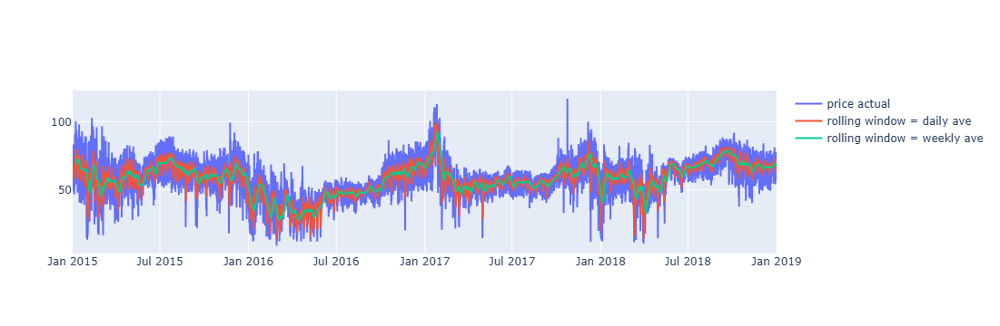

In [60]:
fig = make_subplots()

fig.add_trace(
    go.Line(x=df_weather_energy.index, y=df_weather_energy["price actual"],
                                name="price actual"))
fig.add_trace(
    go.Line(x=df_weather_energy.index,y=df_weather_energy.rolling(window=24).mean()["price actual"],
                                        name="rolling window = daily ave"))
fig.add_trace(
    go.Line(x=df_weather_energy.index,y=df_weather_energy.rolling(window=24*7).mean()["price actual"],
                                        name="rolling window = weekly ave"))
# fig.update_xaxes(rangeslider_visible=True)
fig.show()

- Based on the month bar plot, the actual price in Jan and Dec is high and on weekly daily basis, we witness the lowest price at weekends.

Text(0.5, 1.0, 'Daily actual price (0 is Monday)')

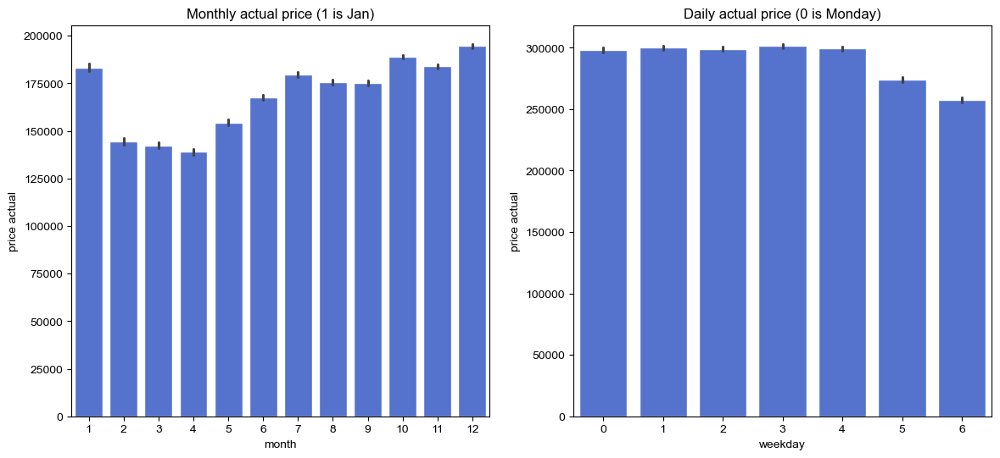

In [61]:
fig, axes = plt.subplots(ncols=2, figsize=(14, 6))
sns.set(style="darkgrid")

sns.barplot(
    x="month", 
    y="price actual", 
    data=df_weather_energy, 
    estimator=sum, 
    color='royalblue',
    ax=axes[0]);
axes[0].set_title('Monthly actual price (1 is Jan)')

sns.barplot(
    x="weekday", 
    y="price actual", 
    data=df_weather_energy, 
    estimator=sum, 
    color='royalblue',
    ax=axes[1]);
axes[1].set_title('Daily actual price (0 is Monday)')

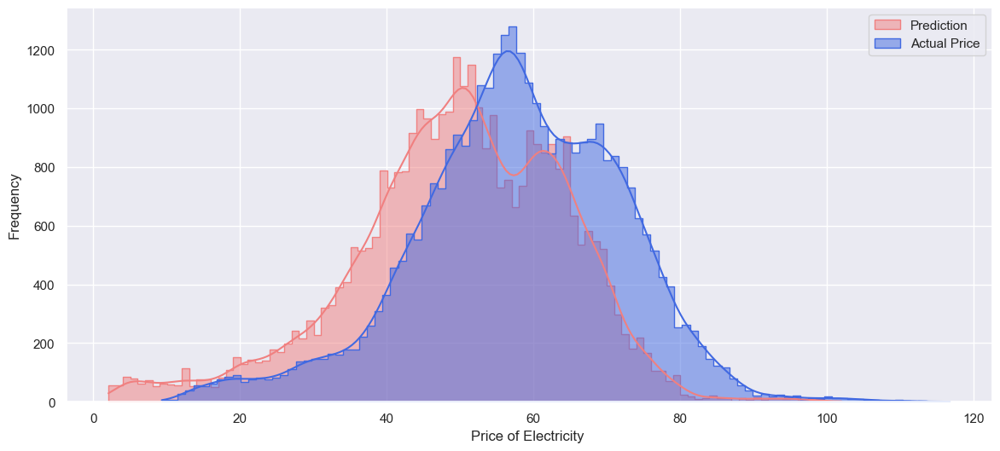

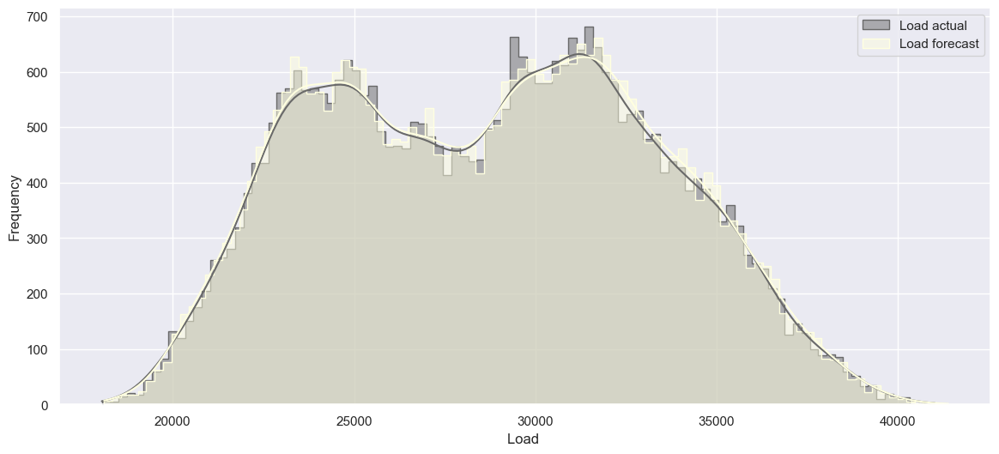

In [62]:
plt.figure(figsize=(14,6))

gr = sns.histplot(df_weather_energy['price day ahead'], bins=100, label='Prediction', element="step", color='lightcoral', kde = True)
gr = sns.histplot(df_weather_energy['price actual'], bins=100, label='Actual Price', element="step", color='royalblue', kde = True)


gr.set(xlabel="Price of Electricity ", ylabel="Frequency")
plt.legend()
plt.show()

plt.figure(figsize=(14,6))
gr = sns.histplot(df_weather_energy['total load actual'], bins=100, label='Load actual', element="step", color='dimgrey', kde = True)
gr = sns.histplot(df_weather_energy['total load forecast'], bins=100, label='Load forecast', element="step", color='lightyellow', kde = True)

gr.set(xlabel="Load ", ylabel="Frequency")
plt.legend()
plt.show()

In [63]:
print(df_weather_energy.columns)

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil gas', 'generation fossil hard coal',
       'generation fossil oil', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation nuclear',
       'generation other', 'generation other renewable', 'generation solar',
       'generation waste', 'generation wind onshore', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual',
       'temp_Barcelona', 'pressure_Barcelona', 'humidity_Barcelona',
       'wind_speed_Barcelona', 'wind_deg_Barcelona', 'rain_1h_Barcelona',
       'snow_3h_Barcelona', 'clouds_all_Barcelona', 'temp_Bilbao',
       'pressure_Bilbao', 'humidity_Bilbao', 'wind_speed_Bilbao',
       'wind_deg_Bilbao', 'rain_1h_Bilbao', 'snow_3h_Bilbao',
       'clouds_all_Bilbao', 'temp_Madrid', 'pressure_Madrid',
       'humidity_Madrid', 'wind_speed_Madrid', 'wind_d

- I tried to estimate the mean absolute error for normalized acutal price and predcition (price day ahead) on the test set. I tried to normalized the data because I used normalized data for training part, so the comparision would be easy.So the MAE for prediction for the test size is 0.07

In [64]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error

In [93]:
y_scaler_actual = MinMaxScaler()
y_scaler_dayahead = MinMaxScaler()

train_cutoff = int(0.8*df_weather_energy.shape[0])
val_cutoff = int(0.9*df_weather_energy.shape[0])

y_price_actual   = df_weather_energy[['price actual']]
y_price_dayahead = df_weather_energy[['price day ahead']]

y_scaler_actual.fit(y_price_actual[:train_cutoff])
actual_norm = y_scaler_actual.transform(y_price_actual)

y_scaler_dayahead.fit(df_weather_energy[['price day ahead']][:train_cutoff])
dayahead_norm = y_scaler_dayahead.transform(y_price_dayahead)

print(f' mean absolute error for normalized acutal price and predcition is : {round(mean_absolute_error(actual_norm, dayahead_norm),3)}')

 mean absolute error for normalized acutal price and predcition is : 0.071


 mean absolute error for normalized acutal price and predcition is : 0.071
As I already explained above, we need to drop total load forecast from the data!

In [66]:
df_weather_energy.drop(['total load forecast'], axis = 1, inplace = True)

- So I decompose the price actual into trend, seasonality and residual(noise). for better visualization, I ploted 100 first observed seasonality and call it as zoomed seasonality.

In [67]:
from statsmodels.tsa.seasonal import seasonal_decompose

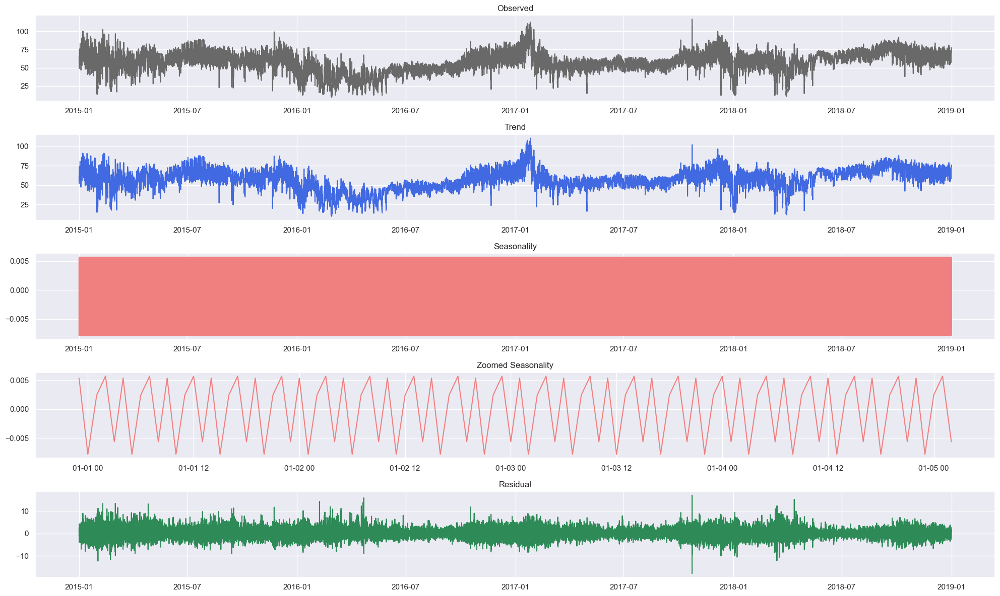

In [68]:
fig, axes = plt.subplots(5, 1, figsize=(20, 12))
decom_data = df_weather_energy[['price actual']].copy()

decompose_result = seasonal_decompose(decom_data, period =5, model='additive')

observed    = decompose_result.observed
trend    = decompose_result.trend
seasonal = decompose_result.seasonal
residual = decompose_result.resid

axes[0].plot(observed, color='dimgrey')
axes[0].set_title('Observed')
axes[1].plot(trend, color='royalblue')
axes[1].set_title('Trend')
axes[2].plot(seasonal, color='lightcoral')
axes[2].set_title('Seasonality')
axes[3].plot(seasonal[:100], color='lightcoral')
axes[3].set_title('Zoomed Seasonality')
axes[4].plot(residual, color='seagreen')
axes[4].set_title('Residual')

fig.tight_layout()
plt.show()

- The Dickey-Fuller test , also known as the Augmented Dickey-Fuller (ADF) test, is a statistical test used to determine whether a time series is stationary or not. Stationarity is an important concept in time series analysis because it affects the ability to model and predict future values. The test uses a null hypothesis that the time series has a unit root, meaning that it is non-stationary. The alternative hypothesis is that the time series is stationary. The test statistic is compared to critical values from tables or computed via a statistical software package. If the test statistic is less than the critical value, the null hypothesis is rejected, and it is concluded that the time series is stationary.

+ In the context of time series analysis, stationarity refers to a property of a time series where the statistical properties of the series do not change over time . More specifically, a stationary time series is one where the mean, variance, and autocorrelation structure of the series do not depend on the time at which they are computed.

+ The concept of stationarity is important in time series analysis because it simplifies the modeling process and enables the use of statistical tools that assume stationarity, such as ARMA (autoregressive moving average) models. In contrast, non-stationary time series can exhibit trends, seasonality, and other systematic patterns that can make it difficult to model and forecast accurately.

In [69]:
from statsmodels.tsa.stattools import adfuller

In [70]:
result = adfuller(df_weather_energy[['price actual']])
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

ADF Statistic: -9.147016232851197
p-value: 2.7504934849341313e-15
Critical Values: {'1%': -3.4305367814665044, '5%': -2.8616225527935106, '10%': -2.566813940257257}


- So based on the comments above we can see that the ADF statistics is even lower than the p value with 1% significance level. So the time series is considered as stationary!
- Autocorrelation is a measure of the linear dependence between a time series and its lagged values. It measures how strongly the values of a time series at one time are correlated with the values at other times. Autocorrelation can be positive (indicating that high values tend to be followed by high values and low values tend to be followed by low values) or negative (indicating that high values tend to be followed by low values and vice versa).

- Partial autocorrelation, on the other hand, measures the linear dependence between a time series and its lagged values, after removing the effect of any intermediate lags . It provides a measure of the direct correlation between two time points, taking into account any indirect correlation through intermediate time points. Partial autocorrelation can help identify the order of an autoregressive (AR) model, which is a model that uses lagged values of the time series as predictors.

In [71]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

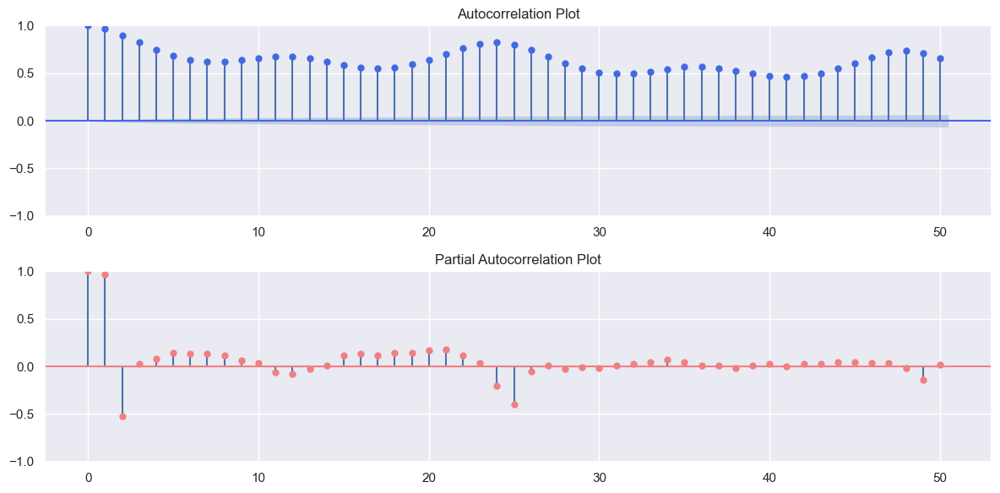

In [72]:
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
plot_acf(df_weather_energy['price actual'], lags=50, ax=ax[0], color='royalblue')
ax[0].set_title('Autocorrelation Plot')
plot_pacf(df_weather_energy['price actual'], lags=50, ax=ax[1], color='lightcoral')
ax[1].set_title('Partial Autocorrelation Plot')
plt.tight_layout()
plt.show()

Based on the partial autocorrolation, we have strong correlation of an observation with its past 25 values (after 25, the correlation becomes very weak). So we use 25 lag feature for our time series!
Dimensionality reduction and train-test split

# Dimensionality reduction and train-test split

In this section I applied PCA for dimensionality reduction and add windowing to the dataset to make it prepared as input for tensorflow. I also split the train, validation and test sets and plot it with seperate colors in the figure. For faster convergnce and better performance of ML/DL models I normalzed the dataset.

In [73]:

X = df_weather_energy.drop(['price actual'], axis = 1)
y= df_weather_energy[['price actual']]

In [74]:
def apply_PCA(X_input, cum_variance, if_apply):
    
    if if_apply:
    
        pca = PCA(n_components = cum_variance)
        # make pipeline to first standardize then apply PCA on data
        scaler_pca = make_pipeline(MinMaxScaler(), pca)
        X_pca = scaler_pca.fit(X_input).transform(X_input)

        return X_pca
    
    else:
        
        return np.array(X_input)

In [75]:
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

In [76]:
params_pca = {'cum_variance' : 0.8, 'if_apply' : True }
X_pca = apply_PCA(X, **params_pca)
X_pca.shape

(35064, 16)

In [77]:
def windowing(X_input,y_input, history_size):
    
    data = []
    labels = []
    for i in range(history_size, len(y_input)):
        data.append(X_input[i - history_size : i, :])
        labels.append(y_input[i])
        
    return np.array(data), np.array(labels).reshape(-1,1)

Normalizing target varialbe, since we already normalized features during the process of applying PCA!

In [78]:
train_cutoff = int(0.8*X_pca.shape[0])
val_cutoff   = int(0.9*X_pca.shape[0])

scaler_y = MinMaxScaler()
scaler_y.fit(y[:train_cutoff])
y_norm = scaler_y.transform(y)


In [79]:
hist_size= 24
data_norm = np.concatenate((X_pca,y_norm), axis = 1)

X_train, y_train = windowing(data_norm[:train_cutoff,:],data_norm[:train_cutoff,-1], hist_size)
X_val, y_val     = windowing(data_norm[train_cutoff :val_cutoff,:],data_norm[train_cutoff:val_cutoff,-1], hist_size)
X_test, y_test   = windowing(data_norm[val_cutoff :,:],data_norm[val_cutoff:,-1], hist_size)

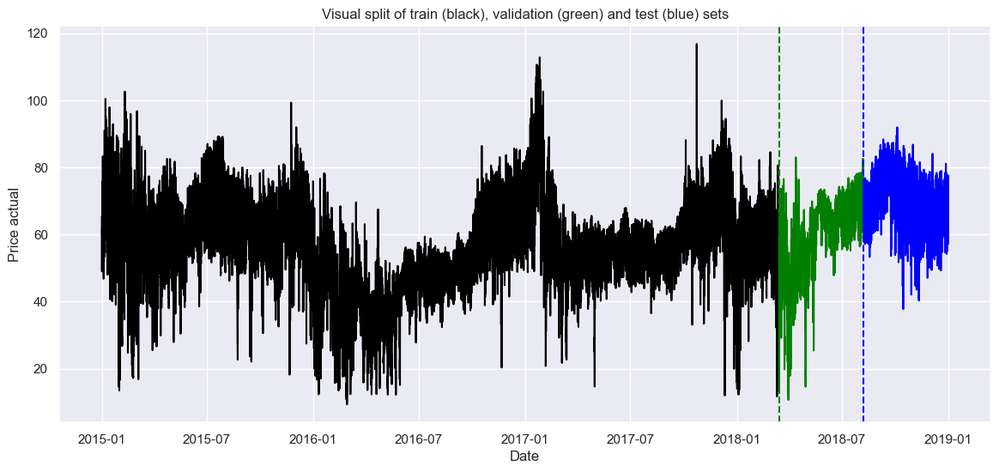

In [80]:
fig, axes = plt.subplots(figsize = (14,6))
axes.plot(df_weather_energy['price actual'].iloc[:train_cutoff], color = 'black')
axes.plot(df_weather_energy['price actual'].iloc[train_cutoff + 1 : val_cutoff], color = 'green')
axes.plot(df_weather_energy['price actual'].iloc[val_cutoff + 1 :], color = 'blue')
axes.axvline(x=df_weather_energy.index[train_cutoff], color='green', linestyle='--')
axes.axvline(x=df_weather_energy.index[val_cutoff], color='blue', linestyle='--')
axes.set_title('Visual split of train (black), validation (green) and test (blue) sets')
axes.set_xlabel('Date')
axes.set_ylabel('Price actual')
plt.show()

## Forecasting

# LSTM

In [81]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

In [82]:
def base_model_lstm():

    model = Sequential()
    model.add(LSTM(units = 32, return_sequences = True, activation="relu", input_shape = X_train.shape[-2:]))
    model.add(Flatten())
    model.add(Dense(units=128, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(1))
    
    return model
optimizer = Adam(learning_rate=0.001)
lstm_model = base_model_lstm()
lstm_model.compile(optimizer = optimizer , loss = 'mean_absolute_error')
lstm_model.summary()

B:\Installedsoftwares\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 24, 32)              │           6,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 768)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          98,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 104,961 (410.00 KB)

 Trainable params: 104,961 (410.00 KB)

 Non-trainable params: 0 (0.00 B)

In [83]:
epoch = 50
batch_size = 64
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=8)

history = lstm_model.fit(X_train, y_train, validation_data = (X_val, y_val), epochs = epoch, 
                   batch_size = batch_size , callbacks=[callback])

Epoch 1/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 10s 17ms/step - loss: 0.0851 - val_loss: 0.0445
Epoch 2/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - loss: 0.0443 - val_loss: 0.0473
Epoch 3/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.0374 - val_loss: 0.0305
Epoch 4/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.0335 - val_loss: 0.0275
Epoch 5/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.0313 - val_loss: 0.0281
Epoch 6/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.0284 - val_loss: 0.0376
Epoch 7/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.0275 - val_loss: 0.0235
Epoch 8/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step - loss: 0.0257 - val_loss: 0.0235
Epoch 9/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.0244 - val_loss: 0.0233
Epoch 10/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 8s 17ms/step - loss: 0.0234 - val_loss: 0.0265
Epoch 11/50
438/438 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - loss: 0.0225 - val_loss: 0.0214
Epoch 12/50
438/438 ━━━━━━━━━━━━━━━━━━━━

In [84]:
import matplotlib.pyplot as plt

In [85]:
y_pred = lstm_model.predict(X_test)
print('')
print('')
print('---------------------------------------------------')
print(f'LSTM MAE for test set : {round(mean_absolute_error(y_pred,y_test),3)}')
print('---------------------------------------------------')
y_pred_actual = scaler_y.inverse_transform(y_pred)
print('')
    

109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


---------------------------------------------------
LSTM MAE for test set : 0.016
---------------------------------------------------



The MAE (Mean Absolute Error) is used to report the results for the normalized test set:

prediction : 0.070
LSTM : 0.015
- Note: LSTM outperformed prediction model